## Дневник действий

Генерация фичей и просто работа с ними:

    1) Обучил Lightgbm со стандартными параметрами, в качестве метрики использовал huber-loss для остановки на валидации. Получил скор 1964.9
    2) Сгенерировал фичи из числовых изначальных фичей, брал их сумму среднее, дисперсии - не дало результата
    3) Объединил пару категориальных фичей в одну путем склейки, убрал одну числовую фичу, так как она коррелировала с остальными - прирост в 1
    4) Выбрал только максимально нескореллированные числовые и категориальные фичи - скор упал
    5) Пытался предсказывать не сами таргеты, а их логарифмы, и затем трансформировать предсказания обратно - не помогло, скор сильно ухудшился

Интерпретация бустинга:

    1) Убрал все числовые фичи - скор упал. Убрал исходя из того, что все самые важны фичи - категориальные
    2) Попытался поменять количество деревьев, количество листьев исходя из графиков о строении обученного бустинга - ничего не получилось

Реализация кастомного скора и метрики:

    1) Удивительно, но обучение с дефолтным objective: regression и метрикой в качестве huberloss оказалось лучше, чем обучение под таргет метрику. Не дало улучшений.

Тюнинг гиперпараметров:

    Скор стал 1948.5. Также попробовал поиграться с катбустом, но скор не вырос, остался таким же. Хотя катбуст на категориальных данных должен вроде как выигрывать сильно.

### Пайплайн с лучшим решением:

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split

import catboost
import lightgbm as lgb
import umap

import optuna
from scipy.special import huber
from sklearn.metrics import mean_squared_error

In [3]:
import warnings

warnings.filterwarnings("ignore")

In [4]:
df_train = pd.read_csv("./aim-2025-something-mysterious/train_contest.csv")
df_test = pd.read_csv("./aim-2025-something-mysterious/test_contest.csv", index_col=0)

In [5]:
cat_features = df_train.columns[df_train.dtypes == 'object']
num_features = df_train.columns[df_train.dtypes != 'object'][:-1]

df_train[cat_features] = df_train[cat_features].astype('category')
df_test[cat_features] = df_test[cat_features].astype('category')

In [6]:
X_train, X_val = train_test_split(df_train, random_state=0xC0FFEE, test_size=0.3)

In [ ]:
def objective_lgb(trial):
    learning_rate = trial.suggest_loguniform('learning_rate', 0.001, 0.2)
    num_leaves = trial.suggest_int('num_leaves', 8, 100)

    params = {
    'objective': 'regression',
    'eta': learning_rate,
    'lambda': 1e-3,
    'seed': 42,
    'num_threads': 0,
    'verbosity': 0,
    'num_leaves': num_leaves
    }

    lgb_tr = lgb.Dataset(X_train.drop('target', axis=1), X_train.target, free_raw_data=False)
    
    model = lgb.train(
        params, lgb_tr, num_boost_round=200,
    )
    
    # Predict and evaluate
    y_pred = model.predict(X_val.drop('target', axis=1))
    custom_score = huber(0.9, y_pred - X_val.target.values) # custom_metric(y_true=X_val.target, y_raw=y_pred)[1]
    return custom_score.mean()

study = optuna.create_study(direction='minimize')

study.optimize(objective_lgb, n_trials=50)

In [ ]:
params = {
    'objective': 'regression',
    'eta': study.best_params['learning_rate'],
    'lambda': 1e-3,
    'seed': 42,
    'num_threads': 0,
    'verbosity': 0,
    'num_leaves': study.best_params['num_leaves']
    }

lgb_tr = lgb.Dataset(df_train.drop(['target'], axis=1), df_train.target, free_raw_data=False, categorical_feature=list(cat_features))
model = lgb.train(
    params, lgb_tr, num_boost_round=200,
)

In [ ]:
predictions = model.predict(df_test)
submission = pd.DataFrame(predictions, columns=['target'])
submission.index = df_test.index
submission.to_csv('submission_final.csv')

## Стартовый сабмишн

In [7]:
lgb_tr = lgb.Dataset(X_train.drop('target', axis=1), X_train.target, free_raw_data=False, categorical_feature=list(cat_features.values))
lgb_val = lgb.Dataset(X_val.drop('target', axis=1), X_val.target, free_raw_data=False, reference=lgb_tr)

params = {
    'objective': 'regression',
    'metric': 'huber',
    'eta': 0.05,
    'lambda': 1e-3,
    'early_stopping_round': 50,
    'seed': 0xC0FFEE,
    'num_threads': 4,
    'verbosity': 1,
    'max_depth': 16
}

In [54]:
model = lgb.train(
    params, lgb_tr, num_boost_round=300,
    valid_names=['train', 'valid'], valid_sets=[lgb_tr, lgb_val],
)

[LightGBM] [Warning] Provided parameters constrain tree depth (max_depth=16) without explicitly setting 'num_leaves'. This can lead to underfitting. To resolve this warning, pass 'num_leaves' (<=65536) in params. Alternatively, pass (max_depth=-1) and just use 'num_leaves' to constrain model complexity.
[LightGBM] [Warning] Provided parameters constrain tree depth (max_depth=16) without explicitly setting 'num_leaves'. This can lead to underfitting. To resolve this warning, pass 'num_leaves' (<=65536) in params. Alternatively, pass (max_depth=-1) and just use 'num_leaves' to constrain model complexity.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015976 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3601
[LightGBM] [Info] Number of data points in the train set: 84065, number of used features: 128
[LightGBM] [Warning] Provided parame

In [9]:
predictions = model.predict(df_test)

In [17]:
submission = pd.DataFrame(predictions, columns=['target'])
submission.index = df_test.index

In [18]:
submission.to_csv('submission.csv')

# Data Explore

Здесь я пытался найти хоть какие-то инсайты из данных. Кажется, просто насгенерили из распределений.

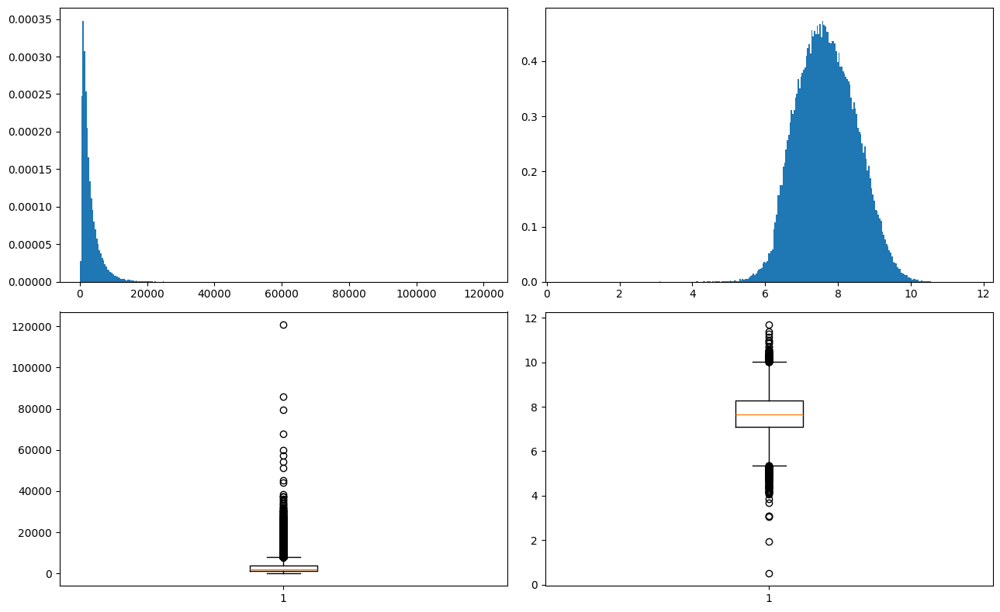

In [19]:
fig, axes = plt.subplots(2, 2, figsize=(13, 8))

axes[0, 0].hist(df_train.target, bins=300, density=True)
axes[0, 1].hist(np.log1p(df_train.target), bins=300, density=True)

axes[1, 0].boxplot(df_train.target)
axes[1, 1].boxplot(np.log1p(df_train.target))

plt.tight_layout()
plt.show()

Распределение со скошенными хвостами, в лог величинах выглядит получше

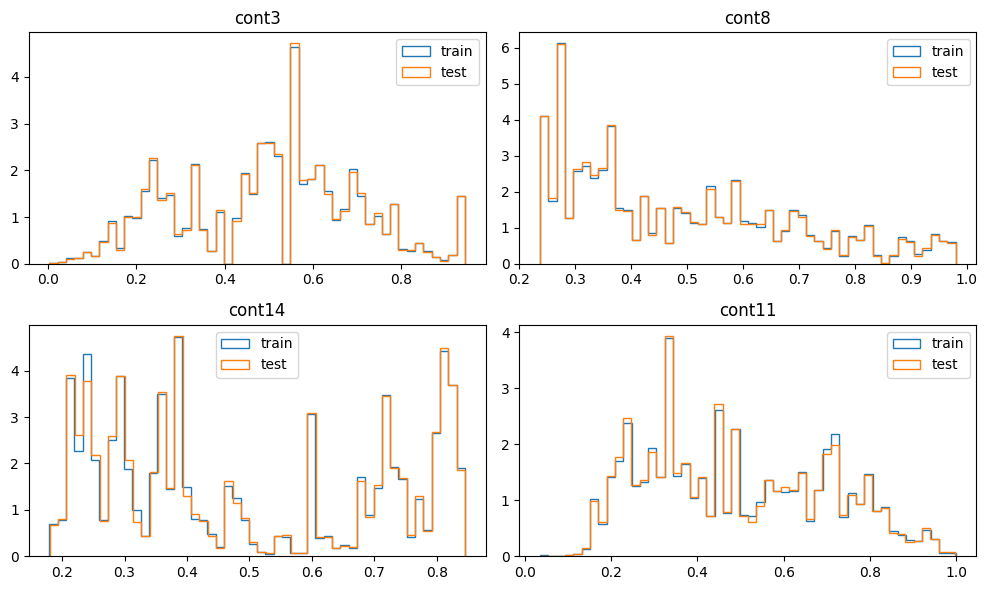

In [20]:
features_to_show = np.random.choice(num_features, 4, replace=False)

fig, axes = plt.subplots(2, 2, figsize=(10, 6))

for i, feat in enumerate(features_to_show):
    axes[i // 2, i % 2].hist(df_train[feat], density=True, histtype='step', bins=50, label='train')
    axes[i // 2, i % 2].hist(df_test[feat], density=True, histtype='step', bins=50, label='test')
    axes[i // 2, i % 2].set_title(feat)
    axes[i // 2, i % 2].legend()

plt.tight_layout()
plt.show()

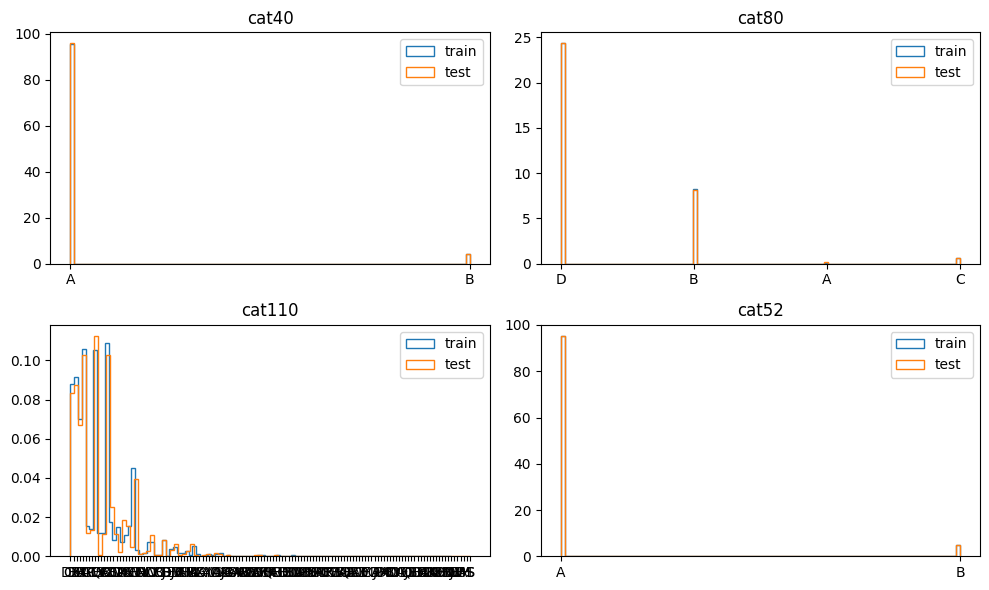

In [21]:
features_to_show = np.random.choice(cat_features, 4, replace=False)

fig, axes = plt.subplots(2, 2, figsize=(10, 6))

for i, feat in enumerate(features_to_show):
    axes[i // 2, i % 2].hist(df_train[feat], density=True, histtype='step', bins=100, label='train')
    axes[i // 2, i % 2].hist(df_test[feat], density=True, histtype='step', bins=100, label='test')
    axes[i // 2, i % 2].set_title(feat)
    axes[i // 2, i % 2].legend()

plt.tight_layout()
plt.show()

В целом, распределения фичей на тесте и трейне совпадаюст, перекосов не нашел

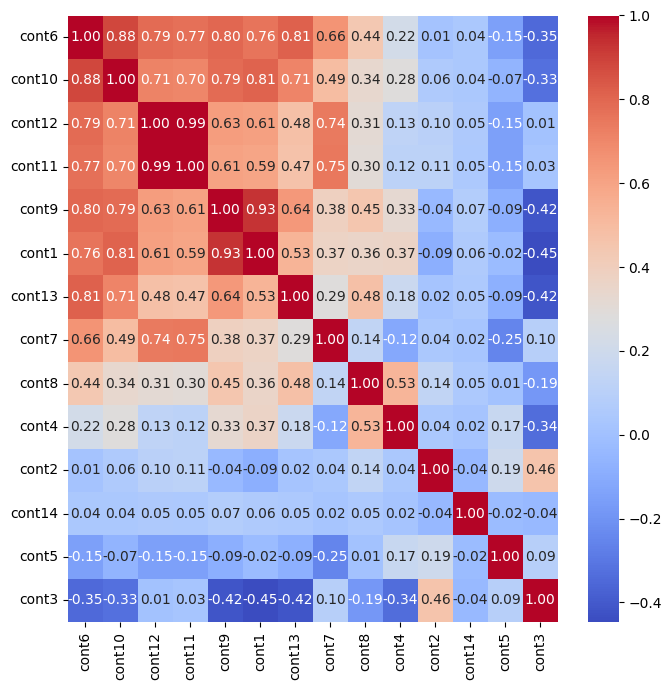

In [22]:
corr = df_train[num_features].corr()
correlation_sums = corr.sum().sort_values(ascending=False)

sorted_features = correlation_sums.index
sorted_correlation_matrix = corr.loc[sorted_features, sorted_features]

plt.figure(figsize=(7, 7))
sns.heatmap(sorted_correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.tight_layout()
plt.show()

2, 5 и 14 фичи слабо скоррелированы с остальными. Также видим, что часть фичей между собой довольно скоррелирована. Тут я отсортировал фичи по суммарной корреляции с другими фичами

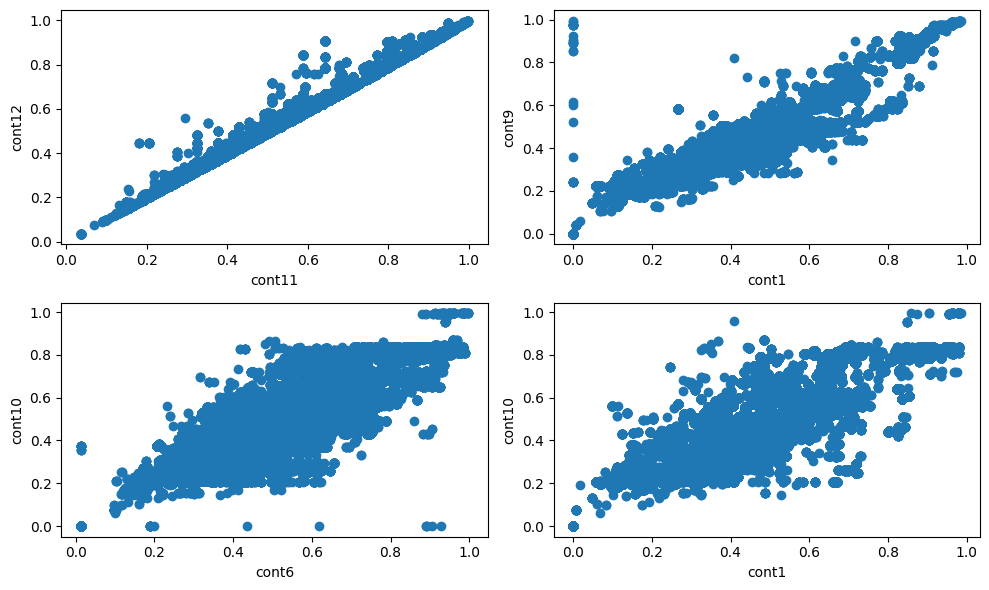

In [23]:
fig, axes = plt.subplots(2, 2, figsize=(10, 6))
axes[0, 0].scatter(df_train['cont11'], df_train['cont12'])
axes[0, 0].set_xlabel('cont11')
axes[0, 0].set_ylabel('cont12')

axes[0, 1].scatter(df_train['cont1'], df_train['cont9'])
axes[0, 1].set_xlabel('cont1')
axes[0, 1].set_ylabel('cont9')

axes[1, 0].scatter(df_train['cont6'], df_train['cont10'])
axes[1, 0].set_xlabel('cont6')
axes[1, 0].set_ylabel('cont10')

axes[1, 1].scatter(df_train['cont1'], df_train['cont10'])
axes[1, 1].set_xlabel('cont1')
axes[1, 1].set_ylabel('cont10')

plt.tight_layout()
plt.show()

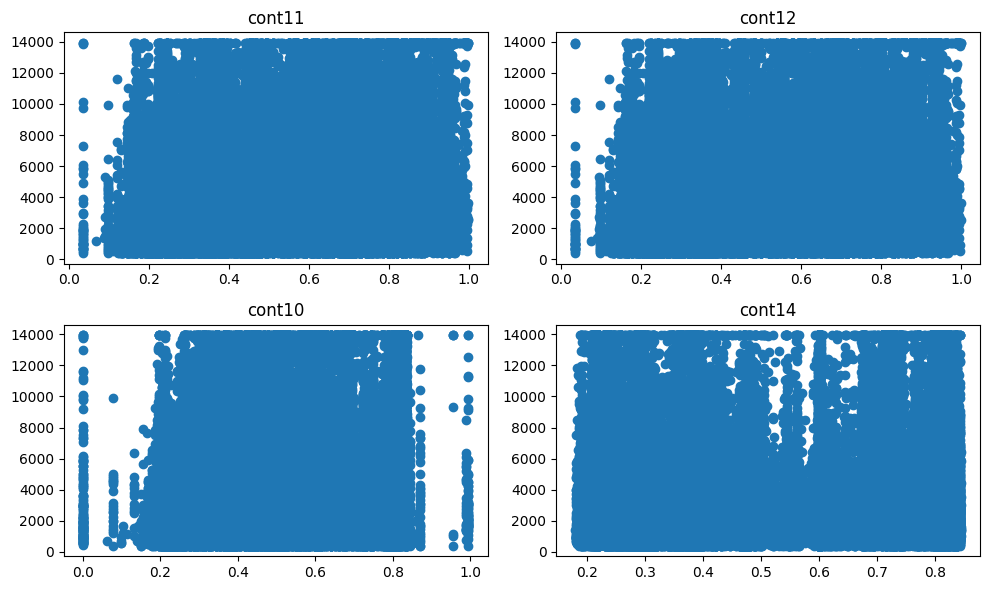

In [24]:
features_to_show = np.random.choice(num_features, 4, replace=False)

fig, axes = plt.subplots(2, 2, figsize=(10, 6))

for i, feat in enumerate(features_to_show):
    axes[i // 2, i % 2].scatter(df_train[feat], df_train.target.clip(np.quantile(df_train.target, 0.01), np.quantile(df_train.target, 0.99)))
    axes[i // 2, i % 2].set_title(feat)

plt.tight_layout()
plt.show()

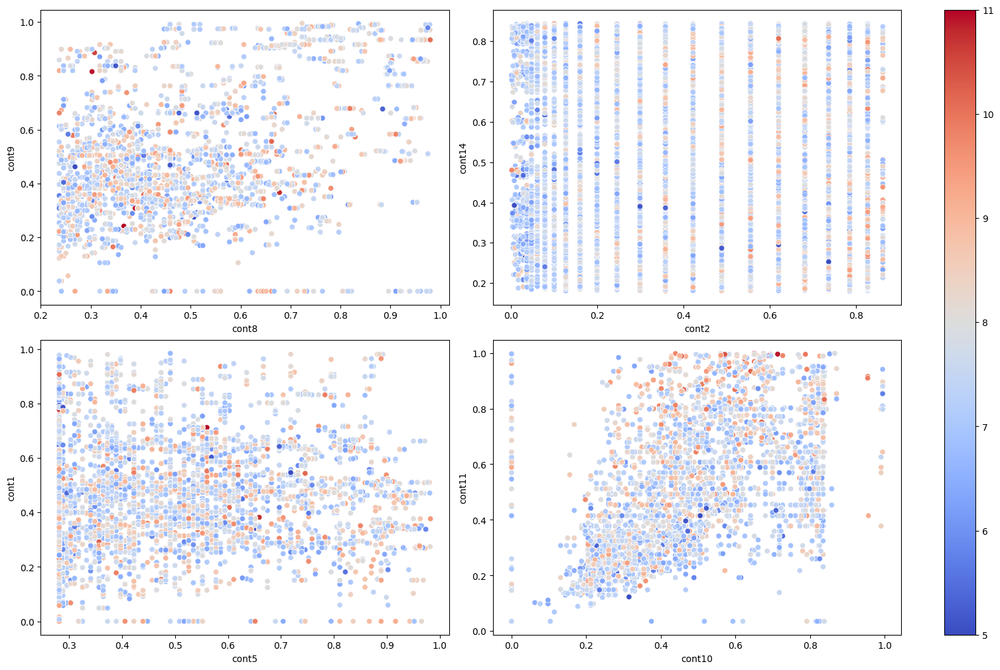

In [25]:
features_to_show = np.random.choice(num_features, (4, 2), replace=False)

fig, axes = plt.subplots(2, 2, figsize=(15, 10), constrained_layout=True)

log_target = np.log1p(df_train['target'])
log_target.clip(5, 11, inplace=True)
norm = plt.Normalize(log_target.min(), log_target.max())
sm = plt.cm.ScalarMappable(cmap='coolwarm', norm=norm)
sm.set_array([])
fig.colorbar(sm, orientation='vertical', ax=axes.ravel().tolist())

for i, feats in enumerate(features_to_show):
    ax = sns.scatterplot(data=df_train, x=feats[0], y=feats[1], hue=log_target, ax=axes[i // 2, i % 2], hue_norm=norm, palette='coolwarm')
    ax.get_legend().remove()

plt.show()

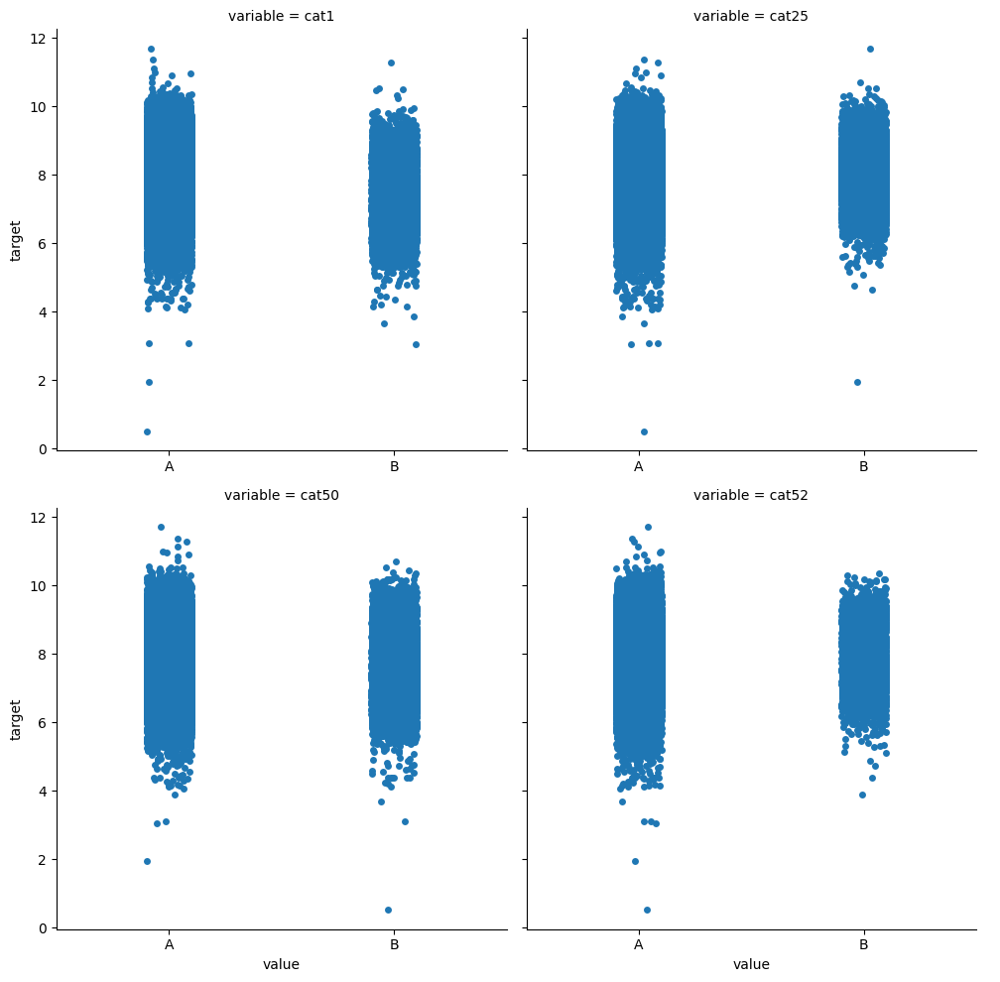

In [26]:
features_to_show = np.random.choice(cat_features, 4, replace=False)

df_toy_cat = df_train.melt(value_vars=features_to_show, id_vars=['target']).sort_values(['variable', 'value'])
sns.catplot(data=df_toy_cat, x='value', y=np.log1p(df_toy_cat['target']), col='variable', col_wrap=2, sharex=False)
plt.show()

Видно, что по категориальным фичам таргет распределен по разному, к примеру у категорий A таргет более сильно разбросан. По числовым фичам кажется нельзя что-то путное узнать.

In [1]:
# Позаимствовал код с ноутбука кэгла из интернета
def cramer_v(df, feature1, feature2, bias_correction=True):
    from scipy import stats

    tab = pd.crosstab(df[feature1], df[feature2])
    chi2 = stats.chi2_contingency(tab)[0]
    n = tab.to_numpy().sum()
    phi2 = chi2 / n
    k, r = tab.shape
    if bias_correction:
        phi2 = max(0, phi2 - (k - 1) * (r - 1) / (n - 1))
        k = k - (k - 1)**2 / (n - 1)
        r = r - (r - 1)**2 / (n - 1)
    v = np.sqrt(phi2 / min(k-1, r-1))
    return(v)

def cramer_matrix(df, features, bias_correction=True):
    import itertools
    
    n = len(features)
    data = np.ones([n, n])
    for i, j in itertools.combinations(range(n), 2):
        data[i, j] = cramer_v(df, features[i], features[j], bias_correction)
        data[j, i] = data[i, j]
    df_cramer = pd.DataFrame(data, index=features, columns=features)
    return df_cramer

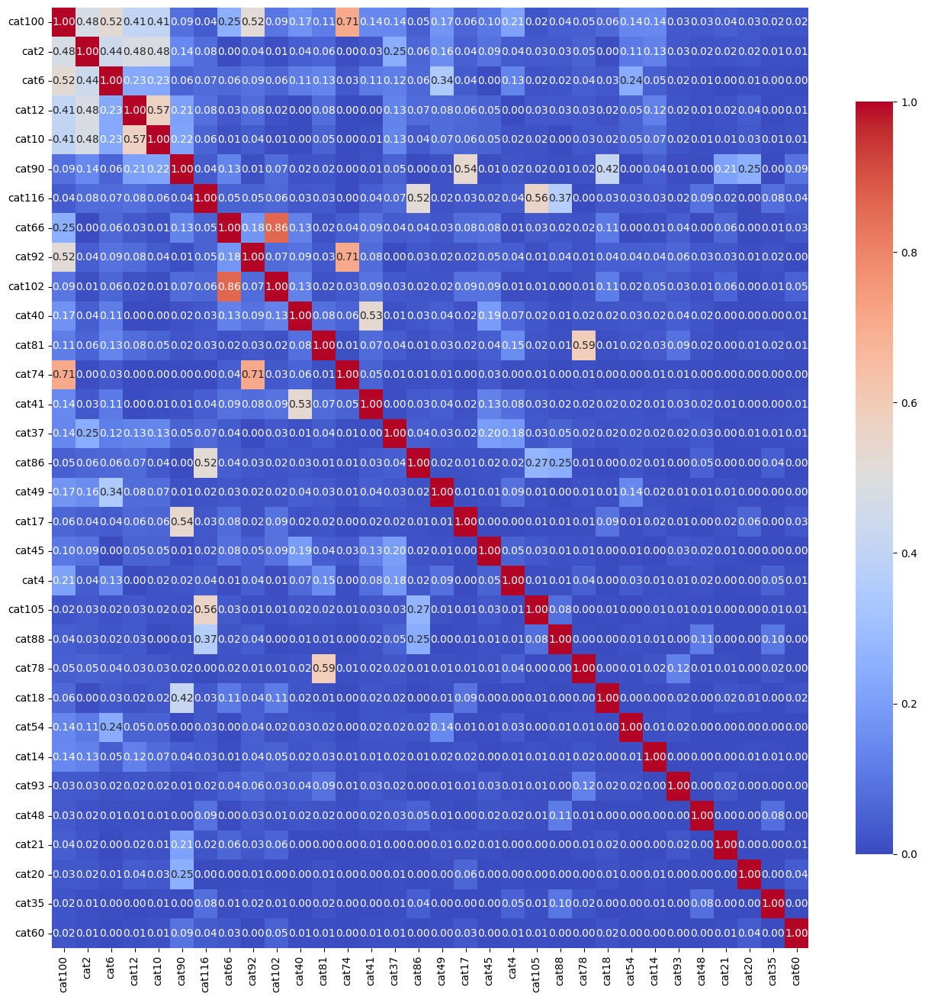

In [28]:
features_to_show = np.random.choice(cat_features, 32, replace=False)

plt.figure(figsize=(16, 16))
df_cramer = cramer_matrix(df_train, features_to_show)
correlation_sums = df_cramer.abs().sum().sort_values(ascending=False)
sorted_features = correlation_sums.index
sorted_correlation_matrix = df_cramer.loc[sorted_features, sorted_features]
sns.heatmap(sorted_correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar_kws={"shrink": .8})
plt.yticks(rotation=0)
plt.show()

In [20]:
df_cramer = cramer_matrix(df_train, cat_features)
correlation_sums = df_cramer.abs().sum().sort_values(ascending=False)
sorted_features = correlation_sums.index
sorted_correlation_matrix = df_cramer.loc[sorted_features, sorted_features]

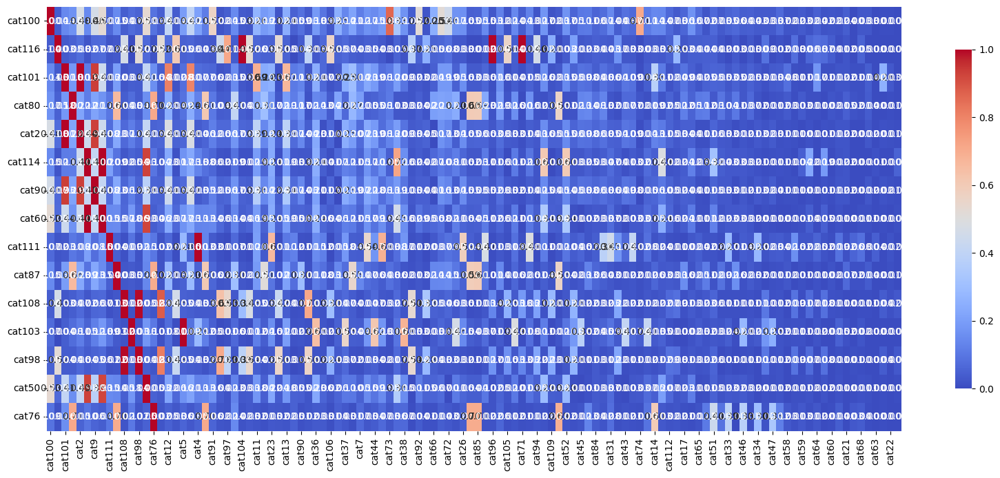

In [21]:
plt.figure(figsize=(20, 8))
sns.heatmap(sorted_correlation_matrix[:15], annot=True, fmt=".2f", cmap='coolwarm', cbar_kws={"shrink": .8})
plt.show()

В категориальных фичах тоже есть корреляции, но отбрасывание сильно скоррелированных не дало результата как такого.

In [ ]:
X_train['cont_sum'] = X_train[num_features].sum(axis=1)
X_train['cont_mean'] = X_train[num_features].mean(axis=1)
X_train['cont_min'] = X_train[num_features].min(axis=1)
X_train['cont_max'] = X_train[num_features].max(axis=1)
X_train['cont_std'] = X_train[num_features].std(axis=1)

X_val['cont_sum'] = X_val[num_features].sum(axis=1)
X_val['cont_mean'] = X_val[num_features].mean(axis=1)
X_val['cont_min'] = X_val[num_features].min(axis=1)
X_val['cont_max'] = X_val[num_features].max(axis=1)
X_val['cont_std'] = X_val[num_features].std(axis=1)

df_test['cont_sum'] = df_test[num_features].sum(axis=1)
df_test['cont_mean'] = df_test[num_features].mean(axis=1)
df_test['cont_min'] = df_test[num_features].min(axis=1)
df_test['cont_max'] = df_test[num_features].max(axis=1)
df_test['cont_std'] = df_test[num_features].std(axis=1)

In [31]:
lgb_tr = lgb.Dataset(X_train.drop('target', axis=1), X_train.target, free_raw_data=False, categorical_feature=list(cat_features))
lgb_val = lgb.Dataset(X_val.drop('target', axis=1), X_val.target, free_raw_data=False, reference=lgb_tr)

In [32]:
model = lgb.train(
    params, lgb_tr, num_boost_round=300,
    valid_names=['train', 'valid'], valid_sets=[lgb_tr, lgb_val],
)

[LightGBM] [Warning] Provided parameters constrain tree depth (max_depth=16) without explicitly setting 'num_leaves'. This can lead to underfitting. To resolve this warning, pass 'num_leaves' (<=65536) in params. Alternatively, pass (max_depth=-1) and just use 'num_leaves' to constrain model complexity.
[LightGBM] [Warning] Provided parameters constrain tree depth (max_depth=16) without explicitly setting 'num_leaves'. This can lead to underfitting. To resolve this warning, pass 'num_leaves' (<=65536) in params. Alternatively, pass (max_depth=-1) and just use 'num_leaves' to constrain model complexity.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022796 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4876
[LightGBM] [Info] Number of data points in the train set: 84065, number of used features: 133
[LightGBM] [Warning] Provided parame

In [ ]:
predictions = model.predict(df_test)
submission = pd.DataFrame(predictions, columns=['target'])
submission.index = df_test.index
submission.to_csv('submission6.csv')

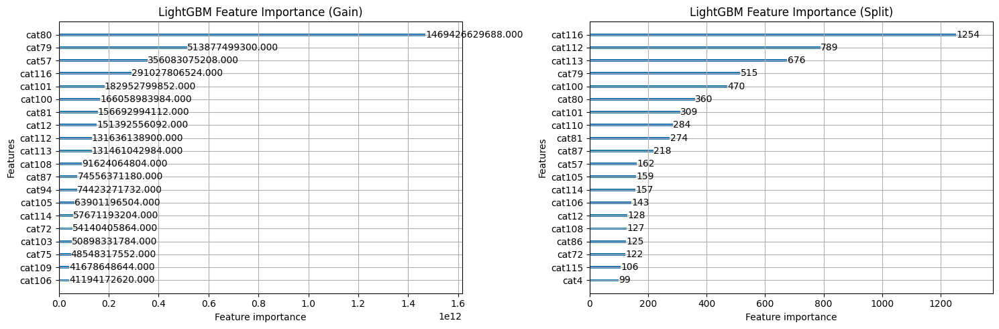

In [88]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

lgb.plot_importance(model, importance_type="gain", 
                    title="LightGBM Feature Importance (Gain)",
                    max_num_features=20, ax=ax[0])

lgb.plot_importance(model, importance_type="split",
                    title="LightGBM Feature Importance (Split)",
                    max_num_features=20, ax=ax[1])

plt.tight_layout()
plt.show()

# Interpretation

### Посмотрим, что внутри бустинга.

In [ ]:
def plot_ensemble_profile(t):
    t['abs_value'] = t.value.abs()
    mosaic = [
        ['weights', 'abs_weights', 'depth'],
        ['cnt', 'hess', 'gain']
    ]
    fig, ax = plt.subplot_mosaic(mosaic, figsize=(15, 8))

    ax['weights'].set_title('Веса в листьях', fontsize=12)
    sns.scatterplot(t.query('split_gain.isnull()'), x='tree_index', y='value', s=50, ax=ax['weights'])
    sns.lineplot(t.query('split_gain.isnull()'), x='tree_index', y='value',  color='orange', lw=3, ax=ax['weights'])

    ax['abs_weights'].set_title('Модули весов в листьях', fontsize=12)
    sns.scatterplot(t.query('split_gain.isnull()'), x='tree_index', y='abs_value', s=50, ax=ax['abs_weights'])
    sns.lineplot(t.query('split_gain.isnull()'), x='tree_index', y='abs_value',  color='orange', lw=3, ax=ax['abs_weights'])

    ax['cnt'].set_title('Количество объектов в листьях', fontsize=12)
    sns.scatterplot(t.query('split_gain.isnull()'), x='tree_index', y='count', s=50, ax=ax['cnt'])
    sns.lineplot(t.query('split_gain.isnull()'), x='tree_index', y='count',  color='orange', lw=3, ax=ax['cnt'])
    ax['cnt'].set_yscale('log')

    ax['hess'].set_title('sum_hessian в знаменателе при сплитах', fontsize=12)
    sns.scatterplot(t, x='tree_index', y='weight', s=50, ax=ax['hess'])
    sns.lineplot(t, x='tree_index', y='weight',  color='orange', lw=3, ax=ax['hess'])
    ax['hess'].set_yscale('log')

    ax['depth'].set_title('Глубина деревьев', fontsize=12)
    sns.scatterplot(t, x='tree_index', y='node_depth', s=50, ax=ax['depth'])
    sns.lineplot(t, x='tree_index', y='node_depth',  color='orange', lw=3, ax=ax['depth'])

    ax['gain'].set_title('Gain', fontsize=12)
    sns.scatterplot(t, x='tree_index', y='split_gain', s=50, ax=ax['gain'])
    sns.lineplot(t, x='tree_index', y='split_gain',  color='orange', lw=3, ax=ax['gain'])
    ax['gain'].set_yscale('log')

    fig.tight_layout()

def my_beeswarm(df: pd.DataFrame, features: list, 
                shap_values: np.ndarray, cat_feature_threshold: float =0.001, 
                top_k: int =13, figsize: tuple =(10, 6), dots: int =1000) -> None:
    """Функция для отрисовки кастомного shap.beeswarm. Принимает на вход исходные данные, список фичей
    для отрисовки, уже посчитанные shap_values, параметры графика, и рисует топ значимых фичей по 
    абсолютному среднему шапу.

    Args:
        df (pd.DataFrame): Таблица данных, на основе которой считались shap values
        features (list): Список признаков, для которых рассчитывалиь shap values, и 
                        которые будут визуализированы
        cat_feature_threshold (float, optional): Минимальный размер категории, чтобы рассматривать
                        ее как отдельный признак. Defaults to 0.001.
        shap_values (np.ndarray, optional): Список shap values, для списка переданных фичей и объектов выборки. 
                                            Defaults to shap_values.
        top_k (int, optional): Сколько фичей отобразить на графике. Отбираются исходя из топа среднего абсолютного шапа. 
                               Defaults to 13.
        figsize (tuple, optional): Размер графика. Defaults to (10, 6).
        dots (int, optional): Сколько максимум точек нужно отобразить для каждой фичи. Defaults to 1000.
    """
    import matplotlib.cm as cm
    import matplotlib.colors as mcolors
    from sklearn.preprocessing import quantile_transform

    shap_df = pd.DataFrame(shap_values[:, :-1], columns=features)
    df_tmp = df[features] # сразу убираем ненужные колонки из исходной таблицы

    # получаем список категориальных фичей
    categorical_features = features[df_tmp[features].dtypes == 'category']

    # считаем средний шап для числовых фичей
    mean_abs_shap_non_categorical = shap_df.drop(categorical_features, axis=1).abs().mean(axis=0)
    feature_names_non_categorical = mean_abs_shap_non_categorical.index.values
    feature_abs_shaps_non_categorical = mean_abs_shap_non_categorical.values

    # Разделяем категориальные колонки по категориям в них, для каждой категории генерируем новое название,
    # достаем для нее ее список shap_values.
    categorical_shap_values = {} # для каждой категории тут будем хранить список шап значений
    cat_feature_names = [] # здесь будем хранить названия новых фичей
    cat_shaps = [] # здесь храним средний абсолютный шап категории
    for cat_feat in categorical_features:
        # для каждой категории категориальной колонки считаем ее вес в исходной выборке.
        # отбираем те категории, чей вес достаточен (больше cat_feature_threshold)
        unique_cat_features = df_tmp[cat_feat].value_counts(normalize=True) 
        significant_caregories = unique_cat_features[unique_cat_features > cat_feature_threshold].index
        significant_indeces = np.where(df_tmp[cat_feat].isin(significant_caregories))[0]
        
        # группируем данные по значительным категориям, из каждой группы достаем список шап значений
        # генерируем название новой фичи, высчитываем ее средний абсолютный шап 
        for category, group in df_tmp.iloc[significant_indeces].groupby(cat_feat, observed=True):
            category_shap_values = shap_df[cat_feat].loc[group.index].values
            category_name = '_'.join([cat_feat, category])
            categorical_shap_values[category_name] = category_shap_values
            cat_feature_names.append(category_name)
            cat_shaps.append(np.abs(category_shap_values).mean())

    # объединяем список названий числовых и категориальных фичей, а так же средние значения шапа
    new_features = np.append(feature_names_non_categorical, cat_feature_names)
    mean_shaps = np.append(feature_abs_shaps_non_categorical, cat_shaps)

    # сортируем по среднему абсолютному шапу, отбираем top_k фичей
    sorted_shap_inds = np.argsort(mean_shaps)[::-1]
    top_feature_names = new_features[sorted_shap_inds][:top_k]

    cat_feature_names = set(cat_feature_names)

    top_shap_data = {} # здесь будем хранить шап значения для топ фичей
    palette = {} # здесь будем хранить раскраску для сэмплов из топ фичей

    cmap = cm.ScalarMappable(norm=mcolors.Normalize(vmin=0, vmax=1), cmap='coolwarm')
    cmap.set_array([])

    for top_name in top_feature_names:
        if top_name in categorical_shap_values:
            # отбираем не более dots точек из имеющихся в данной фиче
            current_feature_shaps = categorical_shap_values[top_name]
            top_shap_data[top_name] = np.random.choice(current_feature_shaps, size=min(dots, len(current_feature_shaps)), replace=False)

            # сохраняем цвет для категориальной фичи (у них цвета одинаковые)
            palette[top_name] = np.array([[0, 1, 0, 1]] * len(top_shap_data[top_name]))
        else:
            # отбираем не более dots точек из имеющихся в данной фиче
            current_feature_shaps = shap_df[top_name].values
            inds = np.random.choice(np.arange(len(current_feature_shaps)), size=min(dots, len(current_feature_shaps)), replace=False)
            top_shap_data[top_name] = current_feature_shaps[inds]

            # Обрабатываем числовые данные. Переводим в квантили
            chosed_samples = df_tmp.iloc[inds][top_name].astype(float)
            chosed_samples = pd.Series(quantile_transform(chosed_samples.values.reshape(-1, 1), n_quantiles=100).reshape(-1))

            # нормируем данные мин-максом. сохраняем цвета.
            scaled_samples = (chosed_samples.values - chosed_samples.min()) / (chosed_samples.max() - chosed_samples.min())
            palette[top_name] = cmap.to_rgba(scaled_samples)
    
    plt.figure(figsize=figsize)
    plt.axvline(0, c='m', linewidth=1, zorder=1)

    for i, feature in enumerate(top_feature_names[::-1]):
        # разделяем объекты на те, у которых наны в данном признаке, и у которых все ок
        nan_mask = palette[feature].sum(axis=1) == 0
        not_nan_mask = ~nan_mask

        # точки с нанами отрисовываем черным
        nan_shaps = top_shap_data[feature][nan_mask]
        plt.scatter(nan_shaps, np.full_like(nan_shaps, i) + np.random.uniform(-0.01, 0.01, size=len(nan_shaps)), 
                    c='black', alpha=0.7, s=5, zorder=3)

        # точки не с нанами отрисовываем обычно
        non_nan_shaps = top_shap_data[feature][not_nan_mask]
        plt.scatter(non_nan_shaps, np.full_like(non_nan_shaps, i) + np.random.uniform(-0.2, 0.2, size=len(non_nan_shaps)), 
                c=palette[feature][not_nan_mask], alpha=0.7, s=5, zorder=2)

    # устанавливаем названия фичей координаты y
    plt.yticks(ticks=np.arange(len(top_feature_names)), labels=top_feature_names[::-1])

    # рисуем серые линии вдоль фичей
    for y_pos in top_feature_names:
        plt.axhline(y=y_pos, color='gray', linestyle='-', linewidth=1, alpha=0.7, zorder=1)

    plt.xlabel("Contribution")
    plt.ylabel("Feature")

    plt.colorbar(cmap, orientation='vertical', ax=plt.gca())

    plt.tight_layout()
    plt.show()


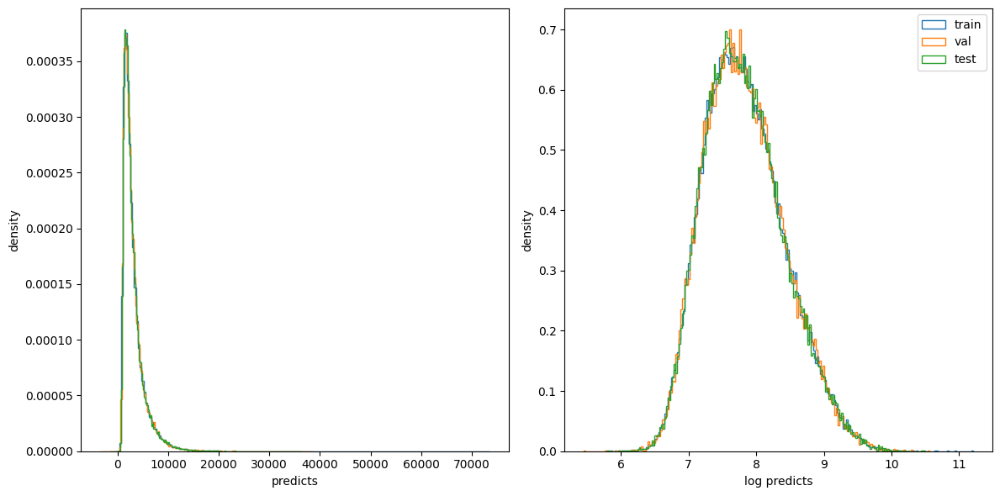

In [141]:
y_pred_tr_raw = model.predict(X_train.drop('target', axis=1), raw_score=True)
y_pred_val_raw = model.predict(X_val.drop('target', axis=1), raw_score=True)
y_pred_test_raw = model.predict(df_test, raw_score=True)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].hist(y_pred_tr_raw, bins=200, label='train', density=True, histtype='step')
axes[0].hist(y_pred_val_raw, bins=200, label='val', density=True, histtype='step')
axes[0].hist(y_pred_test_raw, bins=200, label='test', density=True, histtype='step')
axes[0].set_xlabel('predicts')
axes[0].set_ylabel('density')

axes[1].hist(np.log1p(y_pred_tr_raw), bins=200, label='train', density=True, histtype='step')
axes[1].hist(np.log1p(y_pred_val_raw), bins=200, label='val', density=True, histtype='step')
axes[1].hist(np.log1p(y_pred_test_raw), bins=200, label='test', density=True, histtype='step')
axes[1].set_xlabel('log predicts')
axes[1].set_ylabel('density')

fig.tight_layout()

plt.legend()
plt.show()

Распределение схожее. Кажется, что данные валидации, теста и трейна не сильно отличаются. Это хорошо, данных взяли достаточно для обучения.

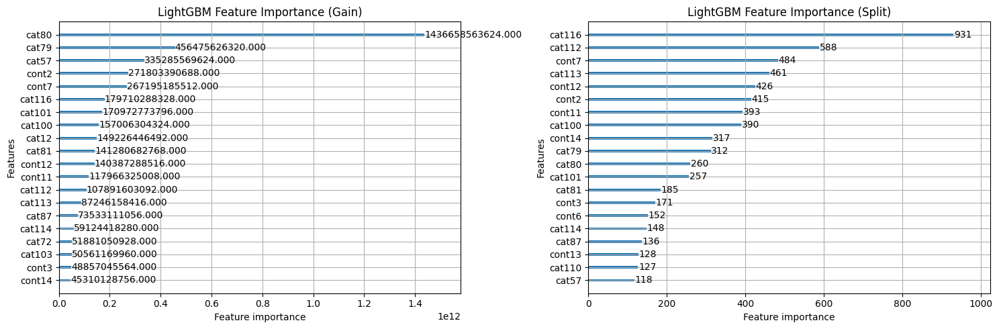

In [142]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

lgb.plot_importance(model, importance_type="gain", 
                    title="LightGBM Feature Importance (Gain)",
                    max_num_features=20, ax=ax[0])

lgb.plot_importance(model, importance_type="split",
                    title="LightGBM Feature Importance (Split)",
                    max_num_features=20, ax=ax[1])

plt.tight_layout()
plt.show()

### Здесь мы видим важности фичей. Одна из фичей преобладает над остальными.

In [143]:
t = model.trees_to_dataframe()
t[t['node_depth'] == 1]

,tree_index,node_depth,node_index,left_child,right_child,parent_index,split_feature,split_gain,threshold,decision_type,missing_direction,missing_type,value,weight,count
0,0,1,0-S0,0-S1,0-S3,None,cat80,1.602030e+11,1,==,right,NaN,3040.070000,84065,84065
61,1,1,1-S0,1-S1,1-S3,None,cat80,1.445850e+11,1,==,right,NaN,-0.000572,84065,84065
122,2,1,2-S0,2-S1,2-S3,None,cat80,1.304910e+11,1,==,right,NaN,-0.001902,84065,84065
183,3,1,3-S0,3-S3,3-S1,None,cat80,1.179790e+11,3,==,right,NaN,-0.003122,84065,84065
244,4,1,4-S0,4-S3,4-S1,None,cat80,1.064990e+11,3,==,right,NaN,-0.000371,84065,84065
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17690,290,1,290-S0,290-S3,290-S1,None,cont11,2.456030e+07,0.986868,<=,left,None,-0.000702,84065,84065
17751,291,1,291-S0,291-S1,291-L1,None,cont12,2.379900e+07,0.99046,<=,left,None,-0.000555,84065,84065
17812,292,1,292-S0,292-S1,292-L1,None,cont11,2.347650e+07,0.990371,<=,left,None,-0.000522,84065,84065
17873,293,1,293-S0,293-S1,293-L1,None,cont12,2.309500e+07,0.99046,<=,left,None,-0.000549,84065,84065


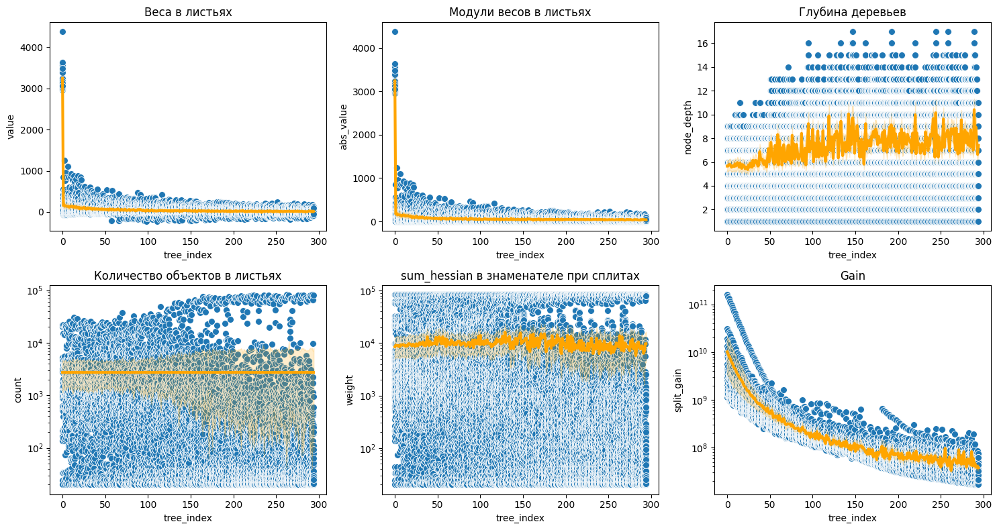

In [145]:
plot_ensemble_profile(t)

In [146]:
t[t['node_depth'] == 1]['split_feature'].value_counts()[:5]

split_feature
cont11    66
cont12    66
cat80     20
cat79     16
cont2     14
Name: count, dtype: int64

In [150]:
def plot_feature_depth(t, top_k=20):
    t_prep = t.copy()
    t_prep.split_feature = t_prep.split_feature.astype('category')
    t_prep = (
        t_prep.query('~split_feature.isnull()')
        .groupby(['node_depth', 'split_feature'], observed=True)
        .size()
        .to_frame('cnt')
        .reset_index()
    )
    t_prep.cnt = t_prep.cnt / 2**(t_prep.node_depth - 1)
    t_prep = t_prep.pivot_table(values='cnt', columns='node_depth', index='split_feature')
    median_cnt = t_prep.sum(axis=1)
    idx = np.argsort(median_cnt)[::-1][:top_k]
    
    sns.heatmap(t_prep.iloc[idx], cmap='coolwarm', annot=False, robust=True)
    plt.gcf().set_size_inches(6, top_k/6 + 1)

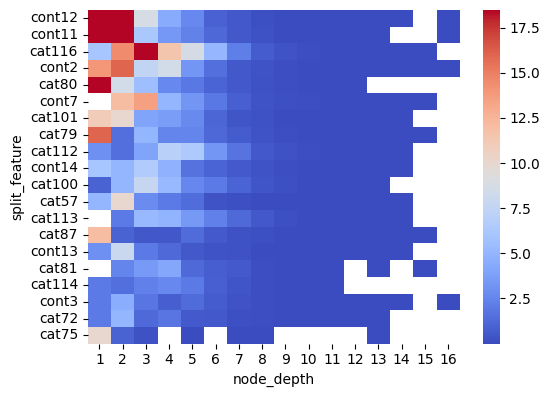

In [151]:
plot_feature_depth(t, top_k=20)

In [69]:
shap_values = model.predict(X_val.drop('target', axis=1), pred_contrib=True)

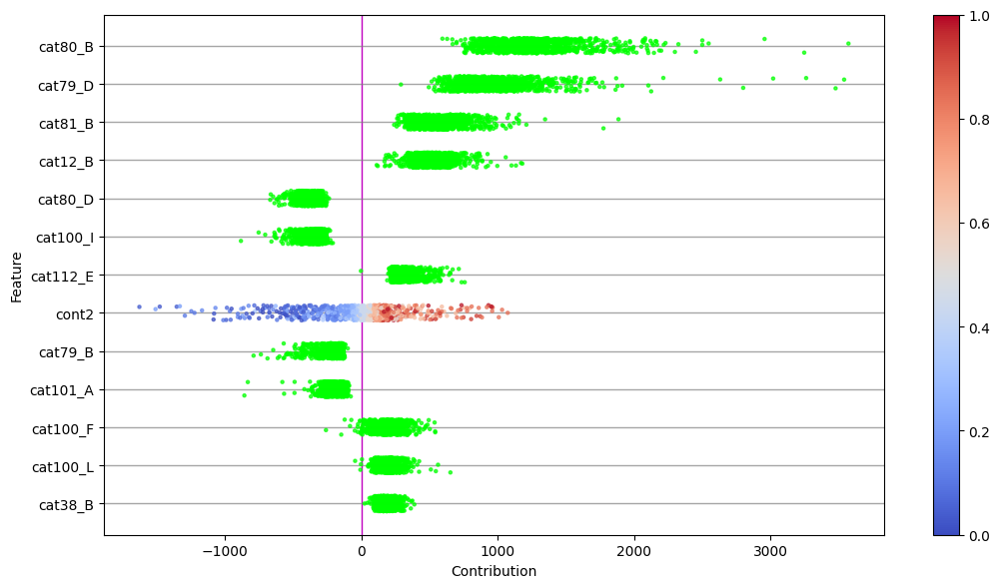

In [70]:
features = df_train.columns.drop('target')

my_beeswarm(X_val.reset_index().drop(['index', 'target'], axis=1), features, cat_feature_threshold=0.1, 
            shap_values=shap_values, top_k=13, figsize=(11, 6), dots=1000)

In [10]:
df_train['cat79_80'] = df_train[['cat79', 'cat80']].agg(''.join, axis=1)
df_train['cat79_80'] = df_train['cat79_80'].astype('category')
df_train.drop(['cat79', 'cat80', 'cont11'], axis=1, inplace=True)

df_test['cat79_80'] = df_test[['cat79', 'cat80']].agg(''.join, axis=1)
df_test['cat79_80'] = df_test['cat79_80'].astype('category')
df_test.drop(['cat79', 'cat80', 'cont11'], axis=1, inplace=True)

In [11]:
cat_features = df_train.columns[df_train.dtypes == 'category']
num_features = df_train.columns[df_train.dtypes != 'category'][:-1]

In [61]:
X_train, X_val = train_test_split(df_train, random_state=0xC0FFEE, test_size=0.3)

lgb_tr = lgb.Dataset(X_train.drop(['target'], axis=1), X_train.target, free_raw_data=False, categorical_feature=list(cat_features.values))
lgb_val = lgb.Dataset(X_val.drop(['target'], axis=1), X_val.target, free_raw_data=False, reference=lgb_tr)

params = {
    'objective': 'regression',
    'metric': 'huber',
    'eta': 0.05,
    'lambda': 1e-3,
    'early_stopping_round': 50,
    'seed': 0xC0FFEE,
    'num_threads': 4,
    'verbosity': 1,
    'max_depth': 16,
}

model = lgb.train(
    params, lgb_tr, num_boost_round=300,
    valid_names=['train', 'valid'], valid_sets=[lgb_tr, lgb_val],
)

[LightGBM] [Warning] Provided parameters constrain tree depth (max_depth=16) without explicitly setting 'num_leaves'. This can lead to underfitting. To resolve this warning, pass 'num_leaves' (<=65536) in params. Alternatively, pass (max_depth=-1) and just use 'num_leaves' to constrain model complexity.
[LightGBM] [Warning] Provided parameters constrain tree depth (max_depth=16) without explicitly setting 'num_leaves'. This can lead to underfitting. To resolve this warning, pass 'num_leaves' (<=65536) in params. Alternatively, pass (max_depth=-1) and just use 'num_leaves' to constrain model complexity.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3383
[LightGBM] [Info] Number of data points in the train set: 84065, number of used features: 126
[LightGBM] [Warning] Provided parame

In [62]:
predictions = model.predict(df_test)
submission = pd.DataFrame(predictions, columns=['target'])
submission.index = df_test.index
submission.to_csv('submission7.csv')

# Понижение размерности

In [72]:
import pickle 
  
# with open('shap_values.pkl', 'wb') as file: 
#     pickle.dump(shap_values , file)

with open('shap_values.pkl', 'rb') as file: 
    shap_values = pickle.load(file)

In [ ]:
import plotly.express as px

mapper = umap.umap_.UMAP(n_jobs=4, n_neighbors=30, metric='euclidean', random_state=1)
emb = mapper.fit_transform(shap_values[:, :-1])

embs = pd.DataFrame({
    'x': emb[:, 0],
    'y': emb[:, 1],
    'color': np.log1p(X_val.target)
})
fig = px.scatter(data_frame=embs, x='x', y='y', color='color')
fig.update_layout(width=800)

## Кастомный лосс и метрика

In [41]:
eps = 100
alpha = 1.2
beta = 0.9
p = 2

def custom_metric(y_raw, tr_data=None, y_true=None):
    if y_true is None:
        y_true = tr_data.get_label()
    
    loss = np.zeros(y_raw.shape[0])
    cond1 = y_raw > (y_true + eps)
    cond2 = y_raw < (y_true - eps)
    loss[cond1] = alpha * (np.abs(y_raw - y_true)[cond1] - eps)**p
    loss[cond2] = beta * (np.abs(y_raw - y_true)[cond2] - eps)**p

    return 'custom_metric', np.sqrt(loss.mean()), False

def custom_metric_grad_hess(y_raw, tr_data=None, y_true=None):
    if y_true is None:
        y_true = tr_data.get_label()
    
    grad = np.zeros(y_raw.shape[0])
    hess = np.zeros(y_raw.shape[0])
    cond1 = y_raw > (y_true + eps)
    cond2 = y_raw < (y_true - eps)
    grad[cond1] = 2 * alpha * (y_raw - y_true - eps)[cond1]
    hess[cond1] = 2 * alpha
    grad[cond2] = 2 * beta * (y_raw - y_true + eps)[cond2]
    hess[cond2] = 2 * beta

    return grad, hess

In [49]:
X_train, X_val = train_test_split(df_train, random_state=0xC0FFEE, test_size=0.3)

lgb_tr = lgb.Dataset(X_train.drop(['target'], axis=1), X_train.target, free_raw_data=False, categorical_feature=list(cat_features.values))
lgb_val = lgb.Dataset(X_val.drop(['target'], axis=1), X_val.target, free_raw_data=False, reference=lgb_tr)

params_custom = {'objective': 'regression',
                    'eta': 0.1,
                    'lambda': 0.001,
                    'early_stopping_round': 50,
                    'seed': 0xC0FFEE,
                    'num_threads': 4,
                    'verbosity': 1,
                    'max_depth': 16}

params_custom['objective'] = custom_metric_grad_hess

model = lgb.train(
    params_custom, lgb_tr,
    feval=custom_metric, num_boost_round=300,
    valid_names=['train', 'valid'], valid_sets=[lgb_tr, lgb_val]
)

[LightGBM] [Warning] Provided parameters constrain tree depth (max_depth=16) without explicitly setting 'num_leaves'. This can lead to underfitting. To resolve this warning, pass 'num_leaves' (<=65536) in params. Alternatively, pass (max_depth=-1) and just use 'num_leaves' to constrain model complexity.
[LightGBM] [Warning] Provided parameters constrain tree depth (max_depth=16) without explicitly setting 'num_leaves'. This can lead to underfitting. To resolve this warning, pass 'num_leaves' (<=65536) in params. Alternatively, pass (max_depth=-1) and just use 'num_leaves' to constrain model complexity.
[LightGBM] [Info] Using self-defined objective function
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021420 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3383
[LightGBM] [Info] Number of data points in the train set: 84065, number of

In [48]:
predictions = model.predict(df_test)
submission = pd.DataFrame(predictions, columns=['target'])
submission.index = df_test.index
submission.to_csv('submission8.csv')

# Тюнинг

In [65]:
def objective_lgb(trial):
    learning_rate = trial.suggest_loguniform('learning_rate', 0.001, 0.2)
    num_leaves = trial.suggest_int('num_leaves', 8, 100)

    params = {
    'objective': 'regression',
    'eta': learning_rate,
    'lambda': 1e-3,
    'seed': 42,
    'num_threads': 0,
    'verbosity': 0,
    'num_leaves': num_leaves
    }

    lgb_tr = lgb.Dataset(X_train.drop('target', axis=1), X_train.target, free_raw_data=False)
    
    model = lgb.train(
        params, lgb_tr, num_boost_round=200,
    )
    
    # Predict and evaluate
    y_pred = model.predict(X_val.drop('target', axis=1))
    custom_score = huber(0.9, y_pred - X_val.target.values) # custom_metric(y_true=X_val.target, y_raw=y_pred)[1]
    return custom_score.mean()

study = optuna.create_study(direction='minimize')

study.optimize(objective_lgb, n_trials=50)

print("Best parameters found: ", study.best_params)
print("Best metric: {:.2f}".format(study.best_value))

[I 2025-05-05 12:05:59,811] A new study created in memory with name: no-name-6c21af35-3742-4a2d-8191-875dbf653358
[I 2025-05-05 12:06:06,552] Trial 0 finished with value: 1078.5087990633867 and parameters: {'learning_rate': 0.04294671108363036, 'num_leaves': 92}. Best is trial 0 with value: 1078.5087990633867.
[I 2025-05-05 12:06:09,526] Trial 1 finished with value: 1087.7611531514617 and parameters: {'learning_rate': 0.029300512723029748, 'num_leaves': 57}. Best is trial 0 with value: 1078.5087990633867.
[I 2025-05-05 12:06:12,064] Trial 2 finished with value: 1111.0338396198413 and parameters: {'learning_rate': 0.01795771628715974, 'num_leaves': 65}. Best is trial 0 with value: 1078.5087990633867.
[I 2025-05-05 12:06:14,133] Trial 3 finished with value: 1186.8142997132936 and parameters: {'learning_rate': 0.010175553328455808, 'num_leaves': 49}. Best is trial 0 with value: 1078.5087990633867.
[I 2025-05-05 12:06:16,710] Trial 4 finished with value: 1288.0181640546436 and parameters: 

Best parameters found:  {'learning_rate': 0.05528317190932097, 'num_leaves': 87}
Best metric: 1077.39


In [66]:
params = {
    'objective': 'regression',
    'eta': 0.05528317190932097,
    'lambda': 1e-3,
    'seed': 42,
    'num_threads': 0,
    'verbosity': 0,
    'num_leaves': 87
    }

lgb_tr = lgb.Dataset(df_train.drop(['target'], axis=1), df_train.target, free_raw_data=False, categorical_feature=list(cat_features))
model = lgb.train(
    params, lgb_tr, num_boost_round=200,
)

In [67]:
predictions = model.predict(df_test)
submission = pd.DataFrame(predictions, columns=['target'])
submission.index = df_test.index
submission.to_csv('submission10.csv')

### Попробуем катбуст. Вдруг сработает лучше.

In [11]:
def objective_cb(trial):
    eta = trial.suggest_loguniform('eta', 1e-3, 0.3)
    depth = trial.suggest_int('depth', 3, 12)

    model = catboost.CatBoostRegressor(
        iterations=200,
        learning_rate=eta,
        depth=depth,
        loss_function='RMSE',
        random_seed=42,
        logging_level='Silent',
        task_type="GPU",
        devices='0'
    )
    
    model.fit(X_train.drop('target', axis=1), X_train.target, verbose=False, cat_features=list(cat_features))

    y_pred = model.predict(X_val.drop('target', axis=1))
    return huber(0.9, y_pred - X_val.target.values).mean()


study = optuna.create_study(direction='minimize')
study.optimize(objective_cb, n_trials=50)

print("Best hyperparameters:")
print(study.best_params)
print("Best score:", study.best_value)

[I 2025-05-05 12:23:56,559] A new study created in memory with name: no-name-7f0cde08-7858-4754-8641-8a5bea88c671
[I 2025-05-05 12:24:37,574] Trial 0 finished with value: 1585.10059871081 and parameters: {'eta': 0.0014030507416300513, 'depth': 10}. Best is trial 0 with value: 1585.10059871081.
[I 2025-05-05 12:25:13,626] Trial 1 finished with value: 1088.4757951521465 and parameters: {'eta': 0.2461101341537535, 'depth': 10}. Best is trial 1 with value: 1088.4757951521465.
[I 2025-05-05 12:25:34,579] Trial 2 finished with value: 1095.0372521566162 and parameters: {'eta': 0.16028949853270905, 'depth': 6}. Best is trial 1 with value: 1088.4757951521465.
[I 2025-05-05 12:26:18,118] Trial 3 finished with value: 1494.1837360571978 and parameters: {'eta': 0.002349846148899301, 'depth': 10}. Best is trial 1 with value: 1088.4757951521465.
[I 2025-05-05 12:26:45,770] Trial 4 finished with value: 1090.2114891842664 and parameters: {'eta': 0.1904635559686998, 'depth': 8}. Best is trial 1 with val

Best hyperparameters:
{'eta': 0.2215268108811436, 'depth': 9}
Best score: 1085.1396687247134


In [13]:
train_pool = catboost.Pool(
    df_train.drop(['target'], axis=1),
    label=df_train.target.values, cat_features=list(cat_features)
)

params = {
    'iterations': 200,
    'depth': 9, 
    'random_seed': 42,
    'loss_function': 'RMSE',
    'task_type': 'GPU',
    'eta': 0.2215268108811436,
    'verbose': 0
}

In [14]:
model = catboost.CatBoost(params)
model.fit(
    train_pool
)

In [16]:
predictions = model.predict(df_test)
submission = pd.DataFrame(predictions, columns=['target'])
submission.index = df_test.index
submission.to_csv('submission11.csv')